This notebook performs gene set enrichment analysis of an EcoTyper results dataset, using `eco_helper enrich`.

## Input Section

This section defines the basic setup of the analysis. The subsequent cells can be run in bulk and need not necessarily be altered in any way.

### Variables to set
- config (optional)
  - The path to the Ecotyper config yaml file used for the experiments to summarize (if the same was used). The project folder can be specified as `{parent}`, the scripts folder within the parent can be specified as `{scripts}` if the config is not within either of these, and absolute path is required.
- directory
  - The name of the Ecotyper results directory. This needs to be either an absolute path or a subdirectory of the results directory within the project directory (parent directory). The results directory can be specified using `{results}`. 
- outdir 
  - The directory to save the outputs in.
- directory_is_absolute
  - Set this to *True* to mark the provided directory not as a subdirectory of the results directory but rather as a raw source directory containing eco_helper enrich results files.
- perform_enrichment (optional)
  - If no pathway enrichment has been performed yet, `eco_helper enrich` is called automatically irrespective of this variable. However, if enrichment has already been performed and data is found, this will force re-computation of the enrichment.

In [1]:
config = None
directory = "{results}/drop_hepato_run1_50"
outdir = "{parent}/gsea_results/drop_hepato_run1_50"

directory_is_absolute = False
perform_enrichment = False

The below variables are only required in case `eco_helper enrich` is called.

### Variables to set

- gene_sets
  - The gene sets to query.
- perform_enrichr
  - Set to False if `gseapy enrichr` should not be performed. This will also enable or disable loading of existing results.
- perform_prerank
  - Set to False if `prerank` should not be performed. This will also enable or disable loading of existing results.
- only_ecotype_contributing
  - Set to True to only perform gene set enrichment on celltypes and states that contribute to assigned Ecotypes.

In [2]:
gene_sets = [   "Reactome_2016", 
                "WikiPathway_2021_Human", 
                "Panther_2016", 
                "KEGG_2021_Human",
                "GO_Biological_Process_2021", 
                "GO_Molecular_Function_2021", 
                "GO_Cellular_Component_2021"  ]

perform_enrichr = True
perform_prerank = False
only_ecotype_contributing = True

---
<br>

> No need to alter anything in this section...

Now import necessary packages

In [3]:
import eco_helper as eh
import eco_helper.enrich as enrich
from qpcr._auxiliary.graphical import make_layout_from_list

import os, glob
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt

import plotly.express as px
import plotly.graph_objs as go

Other project directories (need not necessarily be edited)

In [4]:
if not directory:
    raise ValueError("Please specify a directory.")

# the parent directory of the EcoTyper project
parent = "/data/users/noahkleinschmidt/EcoTyper"

# script and results directories within the parent
scripts = f"{parent}/scripts"
results = f"{parent}/results"
enrichments_dir = f"{parent}/gsea_enrichment"

outdir = outdir.format( parent = parent )
directory = directory.format( parent = parent, results = results )
data_dir = f"{enrichments_dir}/{ os.path.basename( directory ) }" if not directory_is_absolute else directory

if config:
    config = config.format( parent = parent, scripts = scripts )

Make sure we have a valid output directory and (re)-perform enrichment if necessary.

In [5]:
if not os.path.exists( outdir ):
    os.makedirs( outdir )

if not os.path.exists( enrichments_dir ):
    os.makedirs( enrichments_dir )

if perform_enrichment or not os.path.basename( directory ) in os.listdir( enrichments_dir ):
    
    print( "Calling eco_helper enrich")
    def run_enrich( with_enrichr, with_prerank, ecotypes_only ):
        """
        A small helper function to run eco_helper enrich
        """
        enrichr = "--enrichr" if with_enrichr else ""
        prerank = "--prerank" if with_prerank else ""
        ecotypes = "--ecotypes" if ecotypes_only else ""

        cmd = f"eco_helper enrich {enrichr} {prerank} \
                {ecotypes} \
                --assemble \
                --gene_sets { ' '.join( gene_sets ) } \
                --output {data_dir} \
                {directory}"

        os.system( cmd )
    
    run_enrich( with_enrichr = perform_enrichr, with_prerank = perform_prerank, ecotypes_only = only_ecotype_contributing )

Calling eco_helper enrich


Now load the enrichment results for all celltypes or ecotypes into two `EnrichmentCollections`, one for the `prerank` results (if available) and one for the `enrichr` results (if available).

In [6]:
resolution = "ecotype" if only_ecotype_contributing else "celltype"

prerank = None
if perform_prerank:
    prerank = eh.enrich.EnrichmentCollection( data_dir, resolution = resolution, which = "prerank" )

enrichr = None
if perform_enrichr:
    enrichr = eh.enrich.EnrichmentCollection( data_dir, resolution = resolution, which = "enrichr" )

---

## Analysis Section

From here on the user may perform their own analyses on the data.

We are interested in the most over-represented gene sets overall for each ecotype and each cell state therein.

We preprocess the data and flatten the cell-type specific dataframes within each ecotype into a single dataframe.

In [7]:
# split the Term column into GeneSet and Term
prerank.split_terms()

# apply -log10 for FDR
for ecotype in prerank.keys():
    prerank[ ecotype ][ "log10_FDR" ] = -np.log10( prerank[ ecotype ][ "FDR q-val" ] )

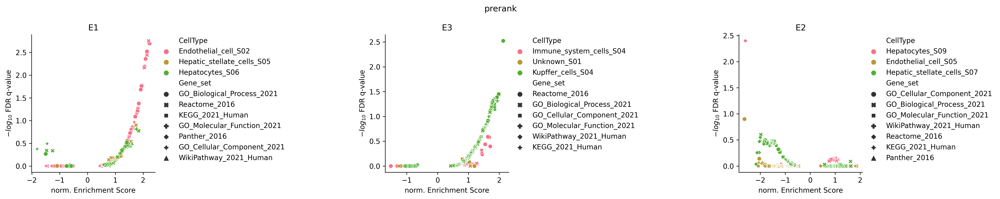

In [8]:
x = "NES"
y = "log10_FDR"
hue = "CellType"
style = "Gene_set"

sns.set_palette( "husl" )
fig = enrich.visualise.scatterplot( 
                                    which = prerank, 
                                    x = x, 
                                    y = y, 
                                    hue = hue, 
                                    style = style,
                                    figsize = (20, 4),
                                    xlabel = "norm. Enrichment Score",
                                    ylabel = "$-log_{10}$ FDR q-value",
                                    )
fig.suptitle( "prerank" )
sns.despine()
plt.tight_layout( w_pad = 10 )

And we also want interactive figures with plotly

In [9]:
import qpcr._auxiliary.graphical as gx
from plotly.subplots import make_subplots 

def make_plotly_subplots( 
                            nrows : int, ncols : int, 
                            headers : list = None, 
                            suptitle : str = None, 
                            xlabel : str = None, 
                            ylabel : str = None, 
                            padding : tuple = None, 
                            size : tuple = None, 
                            template : str = "ggplot2",
                            axes_kind : str = "xy" ):
    """
    Make a plotly subplots figure.

    Parameters
    ----------
    nrows : int
        The number of rows to make.
    ncols : int
        The number of columns to make.
    headers : list
        The subplot headers (titles). This needs to be a list containing one entry for each subplot to make (i.e. nrows * ncols entries). 
    suptitle : str
        The supertitle of the entire figure.
    xlabel : str
        The x-axis label.
    ylabel : str
        The y-axis label.
    padding : tuple
        A tuple of vertical and horizontal padding around the subplots.
    size : tuple
        The total size of the figure as height, width.
    template : str
        One of the plotly themes to use.
    axes_kind : str
        The axes kind to use.
    """

    speclist = gx.make_speclist(nrows, ncols, axes_kind)
    vpad, hpad = padding 
    height, width = size

    fig = make_subplots(
                            rows = nrows, cols = ncols, 
                            specs = speclist, 
                            subplot_titles = headers,
                            horizontal_spacing = hpad,
                            vertical_spacing = vpad
                    )


    Coords = gx.AxesCoords(fig, [], (ncols, nrows))
    Coords.autoincrement()

    fig.update_layout(
                        title = suptitle, 
                        height = height, 
                        width = width,
                        margin = {"autoexpand": True, "pad" : 0, "b": 1, "t": 50}, 
                        autosize = True, 
                        template = template,
                        # legend = {"title" : kwargs.pop("legend_title", ref_col),
                        # },
                    )

    # set default axes labels
    fig.update_xaxes(title_text = xlabel)
    fig.update_yaxes(title_text = ylabel)


In [10]:
hover_data = ["Term", hue, style, "NES" ]
for ecotype, df in prerank:
    fig = px.scatter( df, x = x, y = y, color = hue, symbol = style, title = ecotype, hover_data = hover_data )
    fig.show()

We are interested in the top most showing entries here, so for each ecotype we will check the "head", sorted by FDR q-value.

In [11]:
prerank_ecotypes = list( prerank.values() )

def get_topmost( df : pd.DataFrame, n : int, sortby : str, groupby : str = "CellType", ascending : bool = True ):
    """
    Groups a dataframe by one column, sorts the subsets by another column, returns the concatenated heads of the subsets.

    Parameters
    ----------
    df : pd.DataFrame
        The dataframe to group and sort.
    n : int
        The number of rows to return.
    sortby : str
        The column to sort by.
    groupby : str
        The column to group by.
    ascending : bool
        Whether to sort ascending or descending.
    Returns
    -------
    df : pd.DataFrame
        The dataframe with the topmost rows.
    """
    df = df.groupby( groupby ).apply( lambda x : x.sort_values( by = sortby, ascending = ascending ).head( n ) )
    return df

In [21]:
# column to sort by
sortby = "FDR q-val"

# number of entries to include
n = 10 # (top n)

# ascending
ascending = True

get_topmost( prerank_ecotypes[0], n, sortby, ascending = ascending )

CellType     Name  \
CellType                                                             
Endothelial_cell_S02       2         Endothelial_cell_S02  prerank   
                           3         Endothelial_cell_S02  prerank   
                           0         Endothelial_cell_S02  prerank   
                           1         Endothelial_cell_S02  prerank   
                           5         Endothelial_cell_S02  prerank   
                           4         Endothelial_cell_S02  prerank   
                           6         Endothelial_cell_S02  prerank   
                           7         Endothelial_cell_S02  prerank   
                           8         Endothelial_cell_S02  prerank   
                           9         Endothelial_cell_S02  prerank   
Hepatic_stellate_cells_S05 0   Hepatic_stellate_cells_S05  prerank   
                           1   Hepatic_stellate_cells_S05  prerank   
                           4   Hepatic_stellate_cells_S05  prerank   
                           2   Hepatic_stellate_cells_S05  prerank   
                           3   Hepatic_stellate_cells_S05  prerank   
                           7   Hepatic_stellate_cells_S05  prerank   
                           5   Hepatic_stellate_cells_S05  prerank   
                           6   Hepatic_stellate_cells_S05  prerank   
                           14  Hepatic_stellate_cells_S05  prerank   
                           16  Hepatic_stellate_cells_S05  prerank   
Hepatocytes_S06            1              Hepatocytes_S06  prerank   
                           0              Hepatocytes_S06  prerank   
                           8              Hepatocytes_S06  prerank   
                           2              Hepatocytes_S06  prerank   
                           40             Hepatocytes_S06  prerank   
                           39             Hepatocytes_S06  prerank   
                           5              Hepatocytes_S06  prerank   
                           7              Hepatocytes_S06  prerank   
                           3              Hepatocytes_S06  prerank   
                           6              Hepatocytes_S06  prerank   

                                                                            Term  \
CellType                                                                           
Endothelial_cell_S02       2   Cellular response to heat stress Homo sapiens ...   
                           3   Regulation of HSF1-mediated heat shock respons...   
                           0   'de novo' posttranslational protein folding (G...   
                           1   chaperone cofactor-dependent protein refolding...   
                           5           response to unfolded protein (GO:0006986)   
                           4          HSF1 activation Homo sapiens R-HSA-3371511   
                           6   negative regulation of inclusion body assembly...   
                           7   regulation of inclusion body assembly (GO:0090...   
                           8   regulation of cellular response to stress (GO:...   
                           9        Attenuation phase Homo sapiens R-HSA-3371568   
Hepatic_stellate_cells_S05 0    Developmental Biology Homo sapiens R-HSA-1266738   
                           1   Metabolism of lipids and lipoproteins Homo sap...   
                           4   collagen-containing extracellular matrix (GO:0...   
                           2   positive regulation of multicellular organisma...   
                           3               Metabolism Homo sapiens R-HSA-1430728   
                           7   transport across blood-brain barrier (GO:0150104)   
                           5       Signal Transduction Homo sapiens R-HSA-162582   
                           6         triglyceride metabolic process (GO:0006641)   
                           14            Neuroactive ligand-receptor interaction   
                           16  GPCR downstre

In [22]:
get_topmost( prerank_ecotypes[1], n, sortby, ascending = ascending )

CellType     Name  \
CellType                                                       
Immune_system_cells_S04 2   Immune_system_cells_S04  prerank   
                        1   Immune_system_cells_S04  prerank   
                        3   Immune_system_cells_S04  prerank   
                        0   Immune_system_cells_S04  prerank   
                        6   Immune_system_cells_S04  prerank   
                        5   Immune_system_cells_S04  prerank   
                        4   Immune_system_cells_S04  prerank   
                        35  Immune_system_cells_S04  prerank   
                        19  Immune_system_cells_S04  prerank   
                        20  Immune_system_cells_S04  prerank   
Kupffer_cells_S04       0         Kupffer_cells_S04  prerank   
                        1         Kupffer_cells_S04  prerank   
                        3         Kupffer_cells_S04  prerank   
                        10        Kupffer_cells_S04  prerank   
                        9         Kupffer_cells_S04  prerank   
                        8         Kupffer_cells_S04  prerank   
                        7         Kupffer_cells_S04  prerank   
                        12        Kupffer_cells_S04  prerank   
                        11        Kupffer_cells_S04  prerank   
                        13        Kupffer_cells_S04  prerank   
Unknown_S01             3               Unknown_S01  prerank   
                        5               Unknown_S01  prerank   
                        4               Unknown_S01  prerank   
                        2               Unknown_S01  prerank   
                        6               Unknown_S01  prerank   
                        7               Unknown_S01  prerank   
                        8               Unknown_S01  prerank   
                        9               Unknown_S01  prerank   
                        10              Unknown_S01  prerank   
                        0               Unknown_S01  prerank   

                                                                         Term  \
CellType                                                                        
Immune_system_cells_S04 2             Immune System Homo sapiens R-HSA-168256   
                        1   Adaptive Immune System Homo sapiens R-HSA-1280218   
                        3   Fc epsilon receptor (FCERI) signaling Homo sap...   
                        0   Immunoregulatory interactions between a Lympho...   
                        6   integral component of plasma membrane (GO:0005...   
                        5          regulation of immune response (GO:0050776)   
                        4      Innate Immune System Homo sapiens R-HSA-168249   
                        35  cellular macromolecule biosynthetic process (G...   
                        19  negative regulation of apoptotic process (GO:0...   
                        20  negative regulation of programmed cell death (...   
Kupffer_cells_S04       0      Innate Immune System Homo sapiens R-HSA-168249   
                        1        Complement cascade Homo sapiens R-HSA-166658   
                        3   Initial triggering of complement Homo sapiens ...   
                        10                        Complement Activation WP545   
                        9   regulation of humoral immune response (GO:0002...   
                        8    regulation of complement activation (GO:0030449)   
                        7   regulation of immune effector process (GO:0002...   
                        12                Complement and coagulation cascades   
                        11          Complement and Coagulation Cascades WP558   
                        13                              lysosome (GO:0005764)   
Unknown_S01             3   regulation of transcription by RNA polymerase ...   
                        5   integral component of plasma membrane (GO:0005...   
                        4   positive regulation of

In [23]:
get_topmost( prerank_ecotypes[2], n, sortby, ascending = ascending )

CellType     Name  \
CellType                                                              
Endothelial_cell_S05       852        Endothelial_cell_S05  prerank   
                           849        Endothelial_cell_S05  prerank   
                           850        Endothelial_cell_S05  prerank   
                           847        Endothelial_cell_S05  prerank   
                           848        Endothelial_cell_S05  prerank   
                           846        Endothelial_cell_S05  prerank   
                           796        Endothelial_cell_S05  prerank   
                           543        Endothelial_cell_S05  prerank   
                           539        Endothelial_cell_S05  prerank   
                           540        Endothelial_cell_S05  prerank   
Hepatic_stellate_cells_S07 147  Hepatic_stellate_cells_S07  prerank   
                           146  Hepatic_stellate_cells_S07  prerank   
                           148  Hepatic_stellate_cells_S07  prerank   
                           140  Hepatic_stellate_cells_S07  prerank   
                           113  Hepatic_stellate_cells_S07  prerank   
                           141  Hepatic_stellate_cells_S07  prerank   
                           149  Hepatic_stellate_cells_S07  prerank   
                           114  Hepatic_stellate_cells_S07  prerank   
                           116  Hepatic_stellate_cells_S07  prerank   
                           115  Hepatic_stellate_cells_S07  prerank   
Hepatocytes_S09            23              Hepatocytes_S09  prerank   
                           10              Hepatocytes_S09  prerank   
                           11              Hepatocytes_S09  prerank   
                           14              Hepatocytes_S09  prerank   
                           15              Hepatocytes_S09  prerank   
                           13              Hepatocytes_S09  prerank   
                           12              Hepatocytes_S09  prerank   
                           5               Hepatocytes_S09  prerank   
                           6               Hepatocytes_S09  prerank   
                           7               Hepatocytes_S09  prerank   

                                                                             Term  \
CellType                                                                            
Endothelial_cell_S05       852                               nucleus (GO:0005634)   
                           849  intracellular membrane-bounded organelle (GO:0...   
                           850  Signaling pathways regulating pluripotency of ...   
                           847  Golgi Associated Vesicle Biogenesis Homo sapie...   
                           848                            Hippo signaling pathway   
                           846                    Endoderm differentiation WP2853   
                           796                             Rap1 signaling pathway   
                           543  protein serine/threonine kinase activity (GO:0...   
                           539                                         Amoebiasis   
                           540                    Human cytomegalovirus infection   
Hepatic_stellate_cells_S07 147  mitochondrial ATP synthesis coupled electron t...   
                           146      aerobic electron transport chain (GO:0019646)   
                           148  Transcriptional Regulation by TP53 Homo sapien...   
                           140                               nucleus (GO:0005634)   
                           113                                 Huntington disease   
                           141           Human immunodeficiency virus 1 infection   
                           149    Kaposi sarcoma-associated herpesvirus infection   
                           114                           DNA binding (GO:0003677)   
                           116  Fc epsilon receptor (FCERI) signaling Homo sa

And now we do the same for the enrichr results

In [24]:
# apply log2 fold change for enrichment score and -log10 for FDR
for ecotype in enrichr.keys():

    enrichr[ ecotype ][ "log2_score" ] = np.log2( enrichr[ ecotype ][ "Combined Score" ] ) 
    enrichr[ ecotype ][ "log10_qval" ] = -np.log10( enrichr[ ecotype ][ "Adjusted P-value" ] )

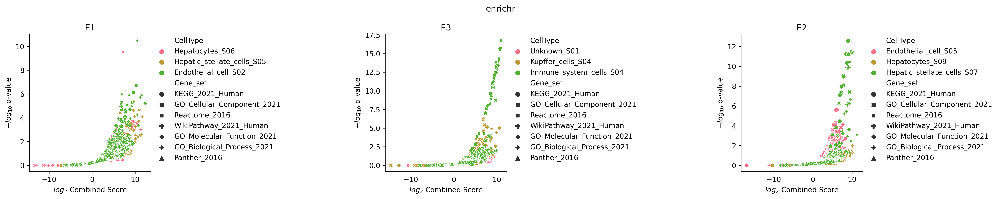

In [31]:
x = "log2_score"
y = "log10_qval"
hue = "CellType"
style = "Gene_set" 

sns.set_palette( "husl" )
fig = enrich.visualise.scatterplot( 
                                    which = enrichr, 
                                    x = x, 
                                    y = y, 
                                    hue = hue, 
                                    style = style,
                                    figsize = (20, 4),
                                    xlabel = "$log_2$ Combined Score",
                                    ylabel = "$-log_{10}$ q-value",
                                )
fig.suptitle( "enrichr" )
sns.despine()
plt.tight_layout( w_pad = 10 )

In [33]:
plt.savefig( f"{outdir}/enrichr_scatterplot.pdf" )

<Figure size 432x288 with 0 Axes>

Also create interactive scatterplots with plotly

In [34]:
hover_data = ["Term", hue, style, "Combined Score" ]
for ecotype, df in enrichr:
    fig = px.scatter( df, x = x, y = y, color = hue, symbol = style, title = ecotype, hover_data = hover_data )
    fig.show()
    fig.write_html( f"{outdir}/enrichr_{ecotype}.plotly.html" )

And we also want to visually inspect the top ranking entries per cell type in tabular form

In [27]:
enrichr_ecotypes = list( enrichr.values() )

# the column to sort by
sortby = "Adjusted P-value"

# number of entries to include
n = n # just use the same as for prerank

# ascending
ascending = ascending # just use the same as for prerank

get_topmost( enrichr_ecotypes[0], n, sortby, ascending = ascending )

CellType  \
CellType                                                      
Endothelial_cell_S02       1359        Endothelial_cell_S02   
                           314         Endothelial_cell_S02   
                           315         Endothelial_cell_S02   
                           1360        Endothelial_cell_S02   
                           1361        Endothelial_cell_S02   
                           1362        Endothelial_cell_S02   
                           1363        Endothelial_cell_S02   
                           1364        Endothelial_cell_S02   
                           316         Endothelial_cell_S02   
                           317         Endothelial_cell_S02   
Hepatic_stellate_cells_S05 457   Hepatic_stellate_cells_S05   
                           458   Hepatic_stellate_cells_S05   
                           459   Hepatic_stellate_cells_S05   
                           460   Hepatic_stellate_cells_S05   
                           62    Hepatic_stellate_cells_S05   
                           461   Hepatic_stellate_cells_S05   
                           462   Hepatic_stellate_cells_S05   
                           463   Hepatic_stellate_cells_S05   
                           464   Hepatic_stellate_cells_S05   
                           465   Hepatic_stellate_cells_S05   
Hepatocytes_S06            189              Hepatocytes_S06   
                           102              Hepatocytes_S06   
                           103              Hepatocytes_S06   
                           104              Hepatocytes_S06   
                           534              Hepatocytes_S06   
                           190              Hepatocytes_S06   
                           438              Hepatocytes_S06   
                           687              Hepatocytes_S06   
                           688              Hepatocytes_S06   
                           105              Hepatocytes_S06   

                                                   Gene_set  \
CellType                                                      
Endothelial_cell_S02       1359  GO_Biological_Process_2021   
                           314                Reactome_2016   
                           315                Reactome_2016   
                           1360  GO_Biological_Process_2021   
                           1361  GO_Biological_Process_2021   
                           1362  GO_Biological_Process_2021   
                           1363  GO_Biological_Process_2021   
                           1364  GO_Biological_Process_2021   
                           316                Reactome_2016   
                           317                Reactome_2016   
Hepatic_stellate_cells_S05 457   GO_Biological_Process_2021   
                           458   GO_Biological_Process_2021   
                           459   GO_Biological_Process_2021   
                           460   GO_Biological_Process_2021   
                           62    GO_Cellular_Component_2021   
                           461   GO_Biological_Process_2021   
                           462   GO_Biological_Process_2021   
                           463   GO_Biological_Process_2021   
                           464   GO_Biological_Process_2021   
                           465   GO_Biological_Process_2021   
Hepatocytes_S06            189                Reactome_2016   
                           102   GO_Cellular_Component_2021   
                           103   GO_Cellular_Component_2021   
                           104   GO_Cellular_Component_2021   
                           534   GO_Molecular_Function_2021   
                           190                Reactome_2016   
                           438       WikiPathway_2021_Human   
                           687   GO_Biological_Process_2021   
                           688   GO_Biological_Process_2021   
                           105   GO_Cellular_Component_2021   

                 

In [28]:
get_topmost( enrichr_ecotypes[1], n, sortby, ascending = ascending )

CellType  \
CellType                                                
Immune_system_cells_S04 233   Immune_system_cells_S04   
                        234   Immune_system_cells_S04   
                        728   Immune_system_cells_S04   
                        235   Immune_system_cells_S04   
                        236   Immune_system_cells_S04   
                        237   Immune_system_cells_S04   
                        238   Immune_system_cells_S04   
                        239   Immune_system_cells_S04   
                        240   Immune_system_cells_S04   
                        246   Immune_system_cells_S04   
Kupffer_cells_S04       1239        Kupffer_cells_S04   
                        1241        Kupffer_cells_S04   
                        1240        Kupffer_cells_S04   
                        201         Kupffer_cells_S04   
                        740         Kupffer_cells_S04   
                        976         Kupffer_cells_S04   
                        1243        Kupffer_cells_S04   
                        1242        Kupffer_cells_S04   
                        202         Kupffer_cells_S04   
                        203         Kupffer_cells_S04   
Unknown_S01             369               Unknown_S01   
                        374               Unknown_S01   
                        370               Unknown_S01   
                        371               Unknown_S01   
                        372               Unknown_S01   
                        373               Unknown_S01   
                        375               Unknown_S01   
                        377               Unknown_S01   
                        376               Unknown_S01   
                        378               Unknown_S01   

                                                Gene_set  \
CellType                                                   
Immune_system_cells_S04 233                Reactome_2016   
                        234                Reactome_2016   
                        728       WikiPathway_2021_Human   
                        235                Reactome_2016   
                        236                Reactome_2016   
                        237                Reactome_2016   
                        238                Reactome_2016   
                        239                Reactome_2016   
                        240                Reactome_2016   
                        246                Reactome_2016   
Kupffer_cells_S04       1239  GO_Biological_Process_2021   
                        1241  GO_Biological_Process_2021   
                        1240  GO_Biological_Process_2021   
                        201   GO_Cellular_Component_2021   
                        740       WikiPathway_2021_Human   
                        976   GO_Molecular_Function_2021   
                        1243  GO_Biological_Process_2021   
                        1242  GO_Biological_Process_2021   
                        202   GO_Cellular_Component_2021   
                        203   GO_Cellular_Component_2021   
Unknown_S01             369   GO_Biological_Process_2021   
                        374   GO_Biological_Process_2021   
                        370   GO_Biological_Process_2021   
                        371   GO_Biological_Process_2021   
                        372   GO_Biological_Process_2021   
                        373   GO_Biological_Process_2021   
                        375   GO_Biological_Process_2021   
                        377   GO_Biological_Process_2021   
                        376   GO_Biological_Process_2021   
                        378   GO_Biological_Process_2021   

                                                                           Term  \
CellType                                                                          
Immune_system_cells_S04 233   Eukaryotic Translation Elongation Homo sapiens...   
                        234   Peptide chain elonga

In [29]:
get_topmost( enrichr_ecotypes[2], n, sortby, ascending = ascending )

CellType  \
CellType                                                      
Endothelial_cell_S05       1665        Endothelial_cell_S05   
                           0           Endothelial_cell_S05   
                           490         Endothelial_cell_S05   
                           491         Endothelial_cell_S05   
                           1667        Endothelial_cell_S05   
                           1666        Endothelial_cell_S05   
                           492         Endothelial_cell_S05   
                           493         Endothelial_cell_S05   
                           245         Endothelial_cell_S05   
                           246         Endothelial_cell_S05   
Hepatic_stellate_cells_S07 0     Hepatic_stellate_cells_S07   
                           309   Hepatic_stellate_cells_S07   
                           1181  Hepatic_stellate_cells_S07   
                           1406  Hepatic_stellate_cells_S07   
                           1405  Hepatic_stellate_cells_S07   
                           1     Hepatic_stellate_cells_S07   
                           2     Hepatic_stellate_cells_S07   
                           310   Hepatic_stellate_cells_S07   
                           3     Hepatic_stellate_cells_S07   
                           956   Hepatic_stellate_cells_S07   
Hepatocytes_S09            467              Hepatocytes_S09   
                           468              Hepatocytes_S09   
                           694              Hepatocytes_S09   
                           560              Hepatocytes_S09   
                           561              Hepatocytes_S09   
                           695              Hepatocytes_S09   
                           696              Hepatocytes_S09   
                           697              Hepatocytes_S09   
                           562              Hepatocytes_S09   
                           698              Hepatocytes_S09   

                                                   Gene_set  \
CellType                                                      
Endothelial_cell_S05       1665  GO_Molecular_Function_2021   
                           0                KEGG_2021_Human   
                           490                Reactome_2016   
                           491                Reactome_2016   
                           1667  GO_Molecular_Function_2021   
                           1666  GO_Molecular_Function_2021   
                           492                Reactome_2016   
                           493                Reactome_2016   
                           245   GO_Cellular_Component_2021   
                           246   GO_Cellular_Component_2021   
Hepatic_stellate_cells_S07 0                KEGG_2021_Human   
                           309                Reactome_2016   
                           1181  GO_Molecular_Function_2021   
                           1406  GO_Biological_Process_2021   
                           1405  GO_Biological_Process_2021   
                           1                KEGG_2021_Human   
                           2                KEGG_2021_Human   
                           310                Reactome_2016   
                           3                KEGG_2021_Human   
                           956       WikiPathway_2021_Human   
Hepatocytes_S09            467       WikiPathway_2021_Human   
                           468       WikiPathway_2021_Human   
                           694   GO_Biological_Process_2021   
                           560   GO_Molecular_Function_2021   
                           561   GO_Molecular_Function_2021   
                           695   GO_Biological_Process_2021   
                           696   GO_Biological_Process_2021   
                           697   GO_Biological_Process_2021   
                           562   GO_Molecular_Function_2021   
                           698   GO_Biological_Process_2021   

                 